In [1]:
import sys
sys.path.append("..") #Parent 
sys.path.append("../..") #grandparent
import torch
from models.components.ldm.denoiser import UNetModel
import numpy as np
import torch.nn.functional as F
import json
import config
import json

In [2]:
import seaborn as sns
sns.set() 

In [3]:
from models.components.unet import DownscalingUnetLightning 
from models.ae_module import AutoencoderKL
from models.components.ae import SimpleConvEncoder, SimpleConvDecoder
from models.components.ldm.denoiser.ddim import DDIMSampler
from models.ldm_module import LatentDiffusion
from DownscalingDataModule import DownscalingDataModule

Instantiating UNet

In [4]:
ckpt_unet = "trained_ckpts/Training_LDM.models.components.unet.DownscalingUnetLightning_checkpoint.ckpt"


In [5]:

model_UNet = DownscalingUnetLightning(
    in_ch=5,  # 4 vars + elevation
    out_ch=4,  # 4 output variables
    features=[64, 128, 256, 512],
    channel_names=["precip", "temp", "temp_min", "temp_max"]
)

In [6]:
unet_state_dict = torch.load(ckpt_unet, map_location="cpu")["state_dict"]
model_UNet.load_state_dict(unet_state_dict, strict=False)
model_UNet.eval()

DownscalingUnetLightning(
  (unet): DownscalingUnet(
    (e1): EncoderBlock(
      (conv): DoubleConv(
        (conv): Sequential(
          (0): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (5): ReLU()
        )
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (e2): EncoderBlock(
      (conv): DoubleConv(
        (conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Conv2d(128, 128, kernel_size=(3,

Instantiating VAE for residual encoding 

In [7]:
ckpt_vae = "trained_ckpts/Training_LDM.models.ae_module.AutoencoderKL_checkpoint.ckpt"

In [8]:
# Debug: Load checkpoint to see the original configuration
checkpoint = torch.load(ckpt_vae, map_location="cpu")

In [9]:
encoder = SimpleConvEncoder(in_dim=4, levels=2, min_ch=16, ch_mult=4)
decoder = SimpleConvDecoder(in_dim=64, levels=2, min_ch=16)  # Changed from levels=2 to levels=1
model_VAE = AutoencoderKL.load_from_checkpoint(
    ckpt_vae,
    encoder=encoder,
    decoder=decoder,
    kl_weight=0.01,
    strict=False 
)
model_VAE.eval()

/work/FAC/FGSE/IDYST/tbeucler/downscaling/sasthana/Downscaling/Downscaling_Models/.micromamba/envs/diffscaler/lib/python3.9/site-packages/lightning/pytorch/core/saving.py:195: Found keys that are not in the model state dict but in the checkpoint: ['unet_regr.e1.conv.conv.0.weight', 'unet_regr.e1.conv.conv.1.weight', 'unet_regr.e1.conv.conv.1.bias', 'unet_regr.e1.conv.conv.1.running_mean', 'unet_regr.e1.conv.conv.1.running_var', 'unet_regr.e1.conv.conv.1.num_batches_tracked', 'unet_regr.e1.conv.conv.3.weight', 'unet_regr.e1.conv.conv.4.weight', 'unet_regr.e1.conv.conv.4.bias', 'unet_regr.e1.conv.conv.4.running_mean', 'unet_regr.e1.conv.conv.4.running_var', 'unet_regr.e1.conv.conv.4.num_batches_tracked', 'unet_regr.e2.conv.conv.0.weight', 'unet_regr.e2.conv.conv.1.weight', 'unet_regr.e2.conv.conv.1.bias', 'unet_regr.e2.conv.conv.1.running_mean', 'unet_regr.e2.conv.conv.1.running_var', 'unet_regr.e2.conv.conv.1.num_batches_tracked', 'unet_regr.e2.conv.conv.3.weight', 'unet_regr.e2.conv.co

AutoencoderKL(
  (encoder): SimpleConvEncoder(
    (net): Sequential(
      (0): ResBlock2D(
        (proj): Conv2d(4, 16, kernel_size=(1, 1), stride=(1, 1))
        (conv1): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (act1): SiLU()
        (act2): SiLU()
        (norm1): GroupNorm(1, 4, eps=1e-05, affine=True)
        (norm2): GroupNorm(1, 16, eps=1e-05, affine=True)
        (sequence): Sequential(
          (0): GroupNorm(1, 4, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): GroupNorm(1, 16, eps=1e-05, affine=True)
          (4): SiLU()
          (5): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (1): Conv2d(16, 16, kernel_size=(2, 2), stride=(2, 2))
      (2): ResBlock2D(
        (proj): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))


Inspecting VAE

dataloader

In [10]:
# Define train and val input/target paths (update file paths as needed)
train_input_paths = {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_input_train_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_input_train_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_input_train_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_input_train_chronological_scaled.nc'
}
train_target_paths = {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_target_train_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_target_train_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_target_train_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_target_train_chronological_scaled.nc'
}
val_input_paths = {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_input_val_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_input_val_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_input_val_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_input_val_chronological_scaled.nc'
}
val_target_paths = {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_target_val_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_target_val_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_target_val_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_target_val_chronological_scaled.nc'
}

test_input_paths= {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_input_test_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_input_test_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_input_test_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_input_test_chronological_scaled.nc'
}

test_target_paths = {
    'precip': f'{config.DATASETS_TRAINING_DIR}/RhiresD_target_test_chronological_scaled.nc',
    'temp': f'{config.DATASETS_TRAINING_DIR}/TabsD_target_test_chronological_scaled.nc',
    'temp_min': f'{config.DATASETS_TRAINING_DIR}/TminD_target_test_chronological_scaled.nc',
    'temp_max': f'{config.DATASETS_TRAINING_DIR}/TmaxD_target_test_chronological_scaled.nc'
}


datasets

In [11]:

elevation_path = f'{config.BASE_DIR}/sasthana/Downscaling/Downscaling_Models/elevation.tif'

Test_dataloader

In [12]:
dm = DownscalingDataModule(
    train_input=train_input_paths,
    train_target=train_target_paths,
    val_input=val_input_paths,
    val_target=val_target_paths,
    test_input=test_input_paths,
    test_target=test_target_paths,
    elevation=elevation_path,
    batch_size=32,
    num_workers=4,
    preprocessing={
        'variables': {
            'input': {
                'precip': 'RhiresD',
                'temp': 'TabsD',
                'temp_min': 'TminD',
                'temp_max': 'TmaxD'
            },
            'target': {
                'precip': 'RhiresD',
                'temp': 'TabsD',
                'temp_min': 'TminD',
                'temp_max': 'TmaxD'
            }
        },
        'preprocessing': {
            'nan_to_num': True,
            'nan_value': 0.0
        }
    }
)
dm.setup()

# Get dataloaders
train_loader = dm.train_dataloader()
val_loader = dm.val_dataloader()
test_loader = dm.test_dataloader()

In [13]:
train_loader = dm.train_dataloader()
val_loader = dm.val_dataloader()
test_loader = dm.test_dataloader()

In [14]:
train_inputs, train_targets = next(iter(train_loader))
val_inputs, val_targets = next(iter(val_loader))
test_inputs, test_targets = next(iter(test_loader))

In [15]:
device= torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_UNet.to(device)
model_VAE.to(device)
#model_LDM.to(device)

AutoencoderKL(
  (encoder): SimpleConvEncoder(
    (net): Sequential(
      (0): ResBlock2D(
        (proj): Conv2d(4, 16, kernel_size=(1, 1), stride=(1, 1))
        (conv1): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (act1): SiLU()
        (act2): SiLU()
        (norm1): GroupNorm(1, 4, eps=1e-05, affine=True)
        (norm2): GroupNorm(1, 16, eps=1e-05, affine=True)
        (sequence): Sequential(
          (0): GroupNorm(1, 4, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(4, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): GroupNorm(1, 16, eps=1e-05, affine=True)
          (4): SiLU()
          (5): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (1): Conv2d(16, 16, kernel_size=(2, 2), stride=(2, 2))
      (2): ResBlock2D(
        (proj): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))


VAE recons:: debug check

In [16]:
import matplotlib.pyplot as plt

In [17]:
idx = 15

In [18]:
with torch.no_grad():
    input_sample = train_inputs[idx].unsqueeze(0).to(device)   # (1, 5, H, W)
    unet_pred = model_UNet(input_sample)                      # (1, 4, H, W)
    residual = unet_pred - input_sample[:, :4, ...]           # (1, 4, H, W)
    mean, logvar = model_VAE.encode(residual)
    z = mean + torch.exp(0.5 * logvar) * torch.randn_like(mean)
    recon_residual = model_VAE.decode(z)


    h = min(input_sample.shape[-2], recon_residual.shape[-2])
    w = min(input_sample.shape[-1], recon_residual.shape[-1])
    recon_pred = input_sample[:, :4, :h, :w] + recon_residual[:, :, :h, :w]


Latent denoising 

In [19]:
h = min(input_sample.shape[-2], recon_residual.shape[-2])
w = min(input_sample.shape[-1], recon_residual.shape[-1])

input_np = input_sample[0, :4, :h, :w].cpu().numpy()
unet_pred_np = unet_pred[0, :, :h, :w].cpu().numpy()
resid_np = (unet_pred[0, :, :h, :w] - input_sample[0, :4, :h, :w]).cpu().numpy()
recon_resid_np = recon_residual[0, :, :h, :w].cpu().numpy()
recon_pred_np = recon_pred[0, :, :h, :w].cpu().numpy()
target_np = train_targets[idx, :, :h, :w].cpu().numpy()

channel_names = ["Precip", "Temp", "Min Temp", "Max Temp"]
n_vars = 4

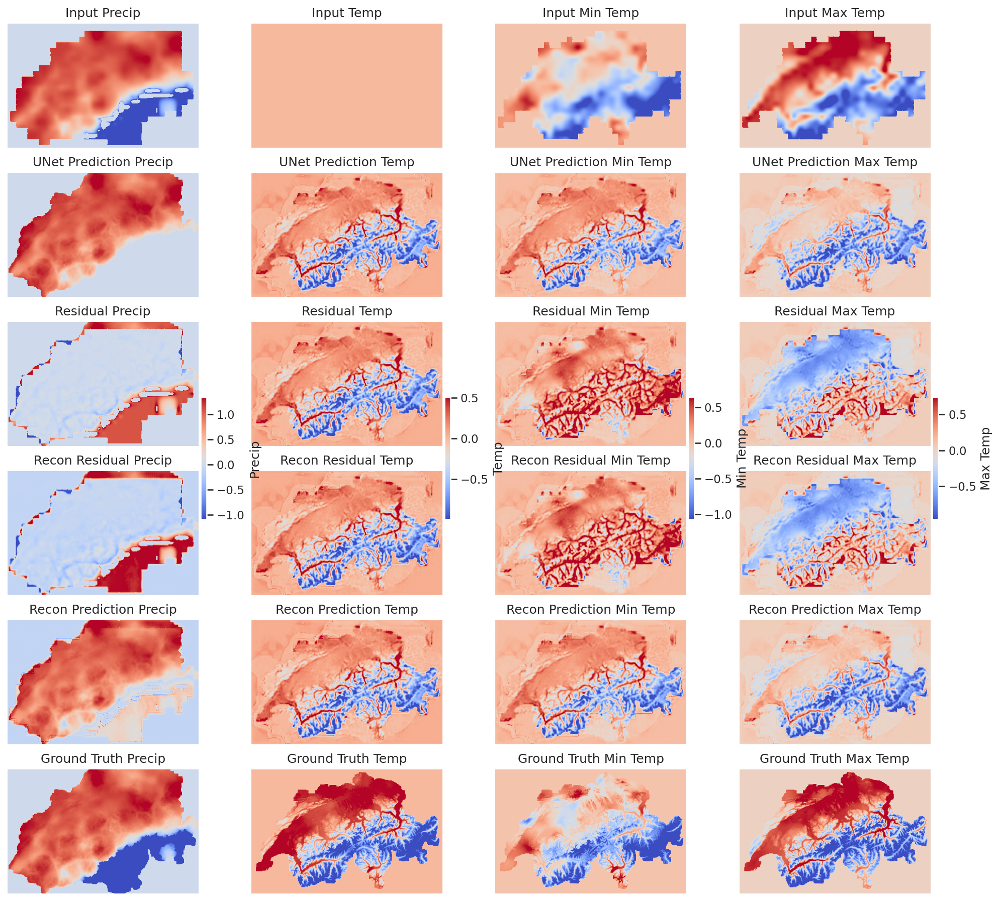

In [20]:
fig, axes = plt.subplots(6, n_vars, figsize=(4 * n_vars, 15), dpi=150)

# Stack all data for vmin/vmax calculation per variable
all_data = np.stack([
    input_np,
    unet_pred_np,
    resid_np,
    recon_resid_np,
    recon_pred_np,
    target_np
])  # shape: (6, n_vars, H, W)

vmins = []
vmaxs = []
for j in range(n_vars):
    vmins.append(np.nanpercentile(all_data[:, j], 2))
    vmaxs.append(np.nanpercentile(all_data[:, j], 98))

im_handles = [None] * n_vars

for j in range(n_vars):
    # Input
    im = axes[0, j].imshow(np.flipud(input_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[0, j].set_title(f"Input {channel_names[j]}")
    axes[0, j].axis('off')
    im_handles[j] = im
    # UNet prediction
    im = axes[1, j].imshow(np.flipud(unet_pred_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[1, j].set_title(f"UNet Prediction {channel_names[j]}")
    axes[1, j].axis('off')
    im_handles[j] = im
    # Residual (unet_pred - input)
    im = axes[2, j].imshow(np.flipud(resid_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[2, j].set_title(f"Residual {channel_names[j]}")
    axes[2, j].axis('off')
    im_handles[j] = im
    # VAE recon residual
    im = axes[3, j].imshow(np.flipud(recon_resid_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[3, j].set_title(f"Recon Residual {channel_names[j]}")
    axes[3, j].axis('off')
    im_handles[j] = im
    # UNet + VAE recon
    im = axes[4, j].imshow(np.flipud(recon_pred_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[4, j].set_title(f"Recon Prediction {channel_names[j]}")
    axes[4, j].axis('off')
    im_handles[j] = im
    # Ground truth
    im = axes[5, j].imshow(np.flipud(target_np[j]), cmap='coolwarm', vmin=vmins[j], vmax=vmaxs[j])
    axes[5, j].set_title(f"Ground Truth {channel_names[j]}")
    axes[5, j].axis('off')
    im_handles[j] = im

# Add one colorbar per variable (column)
for j in range(n_vars):
    fig.colorbar(im_handles[j], ax=axes[:, j], orientation='vertical', fraction=0.03, pad=0.01, label=channel_names[j])

plt.show()

For denoisign in latent space 

In [21]:
ckpt_ldm = "trained_ckpts/LDM_checkpoint_V1_cosine_schedule_1000_steps.ckpt"

remapping of keys for overcoming the error 

In [22]:
ldm_ckpt = torch.load(ckpt_ldm, map_location="cpu")
remapped_ldm_state_dict = {}
for k, v in ldm_ckpt["state_dict"].items():
    if k.startswith("autoencoder.unet_regr.unet."):
        new_key = "autoencoder.unet." + k[len("autoencoder.unet_regr.unet."):]
    elif k.startswith("autoencoder.unet_regr."):
        new_key = "autoencoder.unet." + k[len("autoencoder.unet_regr."):]
    else:
        new_key = k
    remapped_ldm_state_dict[new_key] = v


In [23]:
denoiser=UNetModel(in_channels=32,
  out_channels=32,
  model_channels=64,
  num_res_blocks=2,
  attention_resolutions=[1,2,4],
  context_ch=None,  # [128,128,128,128] #Changed to null for a first experiment (unconditional generation from latent space): AsthanaSh
  channel_mult=[1,2,4,4],
  conv_resample=True,
  dims=2,
  use_fp16=False,
  num_heads=4)

In [24]:
model_LDM = LatentDiffusion(denoiser=denoiser, autoencoder=model_VAE, timesteps=1000)

In [25]:
model_LDM.load_state_dict(remapped_ldm_state_dict, strict=False)
model_LDM.eval()

LatentDiffusion(
  (denoiser): UNetModel(
    (time_embed): Sequential(
      (0): Linear(in_features=64, out_features=256, bias=True)
      (1): SiLU()
      (2): Linear(in_features=256, out_features=256, bias=True)
    )
    (input_blocks): ModuleList(
      (0): TimestepEmbedSequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (1-2): 2 x TimestepEmbedSequential(
        (0): ResBlock(
          (in_layers): Sequential(
            (0): Identity()
            (1): SiLU()
            (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
          (emb_layers): Sequential(
            (0): SiLU()
            (1): Linear(in_features=256, out_features=64, bias=True)
          )
          (out_layers): Sequential(
            (0): Identity()
            (1): SiLU()
            (2): Dropout(p=0, inplace=False)
            (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
      

#Inference goes from Unet----VAE----denosiing within VAE

In [26]:
def ddim_sample_from_t(sampler, model, x_t, t_start, t_end=0, shape=None, **kwargs):
    device = x_t.device
    timesteps = torch.arange(t_start, t_end-1, -1, device=device)
    x = x_t
    for i, t in enumerate(timesteps):
        x, _ = sampler.p_sample_ddim(
            x, None, t.repeat(x.shape[0]), i, **kwargs  #none : no conditioning
        )
    return x

In [27]:
ddim_num_steps = 999
ddim_eta = 0.0

In [28]:
sampler = DDIMSampler(model_LDM,schedule="linear")
sampler.make_schedule(ddim_num_steps=ddim_num_steps, ddim_eta= ddim_eta, verbose=False)  

In [29]:
def get_latent_shape(input_sample):
    dummy_residual = torch.zeros((1, 4, input_sample.shape[-2], input_sample.shape[-1]), device=input_sample.device)
    mean, _ = model_VAE.encode(dummy_residual)
    return mean.shape

def pipeline(input_sample, seed=None):
    with torch.no_grad():
        if seed is not None:
            torch.manual_seed(seed)
            np.random.seed(seed)
        # UNet prediction
        unet_prediction = model_UNet(input_sample)
        # Sample from prior in latent space
        latent_shape = get_latent_shape(input_sample)
        latent = torch.randn(latent_shape, device=unet_prediction.device)
        global ddim_num_steps
        t = torch.tensor([ddim_num_steps-1], device=latent.device).long()
        noisy_latent = model_LDM.q_sample(latent, t, noise=torch.randn_like(latent))
        denoised_latent = ddim_sample_from_t(sampler, model_LDM, noisy_latent, t_start=t.item())
        sampled_residuals = model_VAE.decode(denoised_latent)
        # --- Fix: Crop to minimum shape before adding ---
        h = min(unet_prediction.shape[-2], sampled_residuals.shape[-2])
        w = min(unet_prediction.shape[-1], sampled_residuals.shape[-1])
        unet_prediction_cropped = unet_prediction[..., :h, :w]
        sampled_residuals_cropped = sampled_residuals[..., :h, :w]
        final_prediction = unet_prediction_cropped + sampled_residuals_cropped
        return {
            'unet_prediction': unet_prediction_cropped,
            'sampled_residuals': sampled_residuals_cropped,
            'final_prediction': final_prediction
        }

Datasets for dtaamodule

In [30]:
idx = 15

In [31]:
input_sample = test_inputs[idx].unsqueeze(0)  # (1, 5, H, W)
target_sample = test_targets[idx].unsqueeze(0)  # (1, 4, H, W)
input_sample = input_sample.to(device)
target_sample = target_sample.to(device)
results_list = []

runnign the inference pipeline on the single frame for four vars to generate three samples each

In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_UNet.to(device)
model_VAE.to(device)
model_LDM.to(device) 


LatentDiffusion(
  (denoiser): UNetModel(
    (time_embed): Sequential(
      (0): Linear(in_features=64, out_features=256, bias=True)
      (1): SiLU()
      (2): Linear(in_features=256, out_features=256, bias=True)
    )
    (input_blocks): ModuleList(
      (0): TimestepEmbedSequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (1-2): 2 x TimestepEmbedSequential(
        (0): ResBlock(
          (in_layers): Sequential(
            (0): Identity()
            (1): SiLU()
            (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
          (emb_layers): Sequential(
            (0): SiLU()
            (1): Linear(in_features=256, out_features=64, bias=True)
          )
          (out_layers): Sequential(
            (0): Identity()
            (1): SiLU()
            (2): Dropout(p=0, inplace=False)
            (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
      

In [33]:
for i in range(3):
    results = pipeline(input_sample,seed=i)
    results_list.append(results)

Plotting residuals 

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

Denormalisation and plotting  : 


In [35]:
#Denorm function

In [36]:
with open(f'{config.DATASETS_TRAINING_DIR}/RhiresD_scaling_params_chronological.json', 'r') as f:
    pr_params = json.load(f)
with open(f'{config.DATASETS_TRAINING_DIR}/TabsD_scaling_params_chronological.json', 'r') as f:
    temp_params = json.load(f)
with open(f'{config.DATASETS_TRAINING_DIR}/TminD_scaling_params_chronological.json', 'r') as f:
    temp_min_params = json.load(f)
with open(f'{config.DATASETS_TRAINING_DIR}/TmaxD_scaling_params_chronological.json', 'r') as f:
    temp_max_params = json.load(f)

def denorm_pr(x):

    return np.exp(x * pr_params['std'] + pr_params['mean']) - pr_params['epsilon']

def denorm_temp(x, params):

    return x * params['std'] + params['mean']


denorm and plotting 

In [37]:
def denorm_plot_samples(results_list, input_sample, target_sample):
    input_np = input_sample[0, :4].cpu().numpy()
    target_np = target_sample[0].cpu().numpy()
    input_denorm = np.empty_like(input_np)
    target_denorm = np.empty_like(target_np)
    for i, (var, params) in enumerate([
        ("precip", pr_params),
        ("temp", temp_params), 
        ("temp_min", temp_min_params),
        ("temp_max", temp_max_params)
    ]):
        if var == "precip":
            input_denorm[i] = denorm_pr(input_np[i])
            target_denorm[i] = denorm_pr(target_np[i])
        else:
            input_denorm[i] = denorm_temp(input_np[i], params)
            target_denorm[i] = denorm_temp(target_np[i], params)

    # Mask: original NaN grid cells in input
    mask = np.any(np.isnan(input_np), axis=0)

    channel_names = ["Precip", "Temp", "Min Temp", "Max Temp"]
    n_vars = 4
    n_samples = len(results_list)
    n_rows = n_samples + 3

    fig, axes = plt.subplots(n_rows, n_vars, figsize=(5 * n_vars, 3.5 * n_rows), dpi=200)

    # Color normalization using percentiles for better contrast
    vmin = np.nanpercentile(target_denorm, 2)
    vmax = np.nanpercentile(target_denorm, 98)
    # Ensure precipitation scale starts at 0
    vmin_precip = 0

    # Custom colormap: coolwarm with NaNs as white
    cmap = sns.color_palette("coolwarm", as_cmap=True)
    cmap.set_bad(color='white')

    # Top row: Input
    for j in range(n_vars):
        arr = input_denorm[j].copy()
        mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
        arr[mask_cropped] = np.nan
        if channel_names[j].lower().startswith("precip"):
            sns.heatmap(np.flipud(arr), ax=axes[0, j], cmap=cmap, vmin=vmin_precip, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        else:
            sns.heatmap(np.flipud(arr), ax=axes[0, j], cmap=cmap, vmin=vmin, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        axes[0, j].set_title(f"Input to UNet - {channel_names[j]}")
        axes[0, j].axis('off')

    # Second row: UNet Prediction
    unet_np = results_list[0]['unet_prediction'][0].cpu().numpy()
    for j in range(n_vars):
        if channel_names[j].lower().startswith("precip"):
            unet_denorm = denorm_pr(unet_np[j])
            arr = np.clip(unet_denorm.copy(), 0, None)
            mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
            arr[mask_cropped] = np.nan
            sns.heatmap(np.flipud(arr), ax=axes[1, j], cmap=cmap, vmin=vmin_precip, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        else:
            params = [pr_params, temp_params, temp_min_params, temp_max_params][j]
            unet_denorm = denorm_temp(unet_np[j], params)
            arr = unet_denorm.copy()
            mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
            arr[mask_cropped] = np.nan
            sns.heatmap(np.flipud(arr), ax=axes[1, j], cmap=cmap, vmin=vmin, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        axes[1, j].set_title(f"UNet Prediction - {channel_names[j]}")
        axes[1, j].axis('off')

    # Middle rows: Samples
    for i, results in enumerate(results_list):
        final_np = results['final_prediction'][0].cpu().numpy()
        for j in range(n_vars):
            if channel_names[j].lower().startswith("precip"):
                sample_denorm = np.clip(denorm_pr(final_np[j]), 0, None)  # Ensure non-negative
                arr = sample_denorm.copy()
                mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
                arr[mask_cropped] = np.nan
                sns.heatmap(np.flipud(arr), ax=axes[i+2, j], cmap=cmap, vmin=vmin_precip, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
            else:
                params = [pr_params, temp_params, temp_min_params, temp_max_params][j]
                sample_denorm = denorm_temp(final_np[j], params)
                arr = sample_denorm.copy()
                mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
                arr[mask_cropped] = np.nan
                sns.heatmap(np.flipud(arr), ax=axes[i+2, j], cmap=cmap, vmin=vmin, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
            axes[i+2, j].set_title(f"Sample {i+1} - {channel_names[j]}")
            axes[i+2, j].axis('off')

    # Bottom row: Ground Truth
    for j in range(n_vars):
        arr = target_denorm[j].copy()
        mask_cropped = mask[:arr.shape[-2], :arr.shape[-1]]
        arr[mask_cropped] = np.nan
        if channel_names[j].lower().startswith("precip"):
            sns.heatmap(np.flipud(arr), ax=axes[-1, j], cmap=cmap, vmin=vmin_precip, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        else:
            sns.heatmap(np.flipud(arr), ax=axes[-1, j], cmap=cmap, vmin=vmin, vmax=vmax, cbar=True, cbar_kws={'shrink': 0.7})
        axes[-1, j].set_title(f"Ground Truth - {channel_names[j]}")
        axes[-1, j].axis('off')

    plt.tight_layout()
    plt.show()

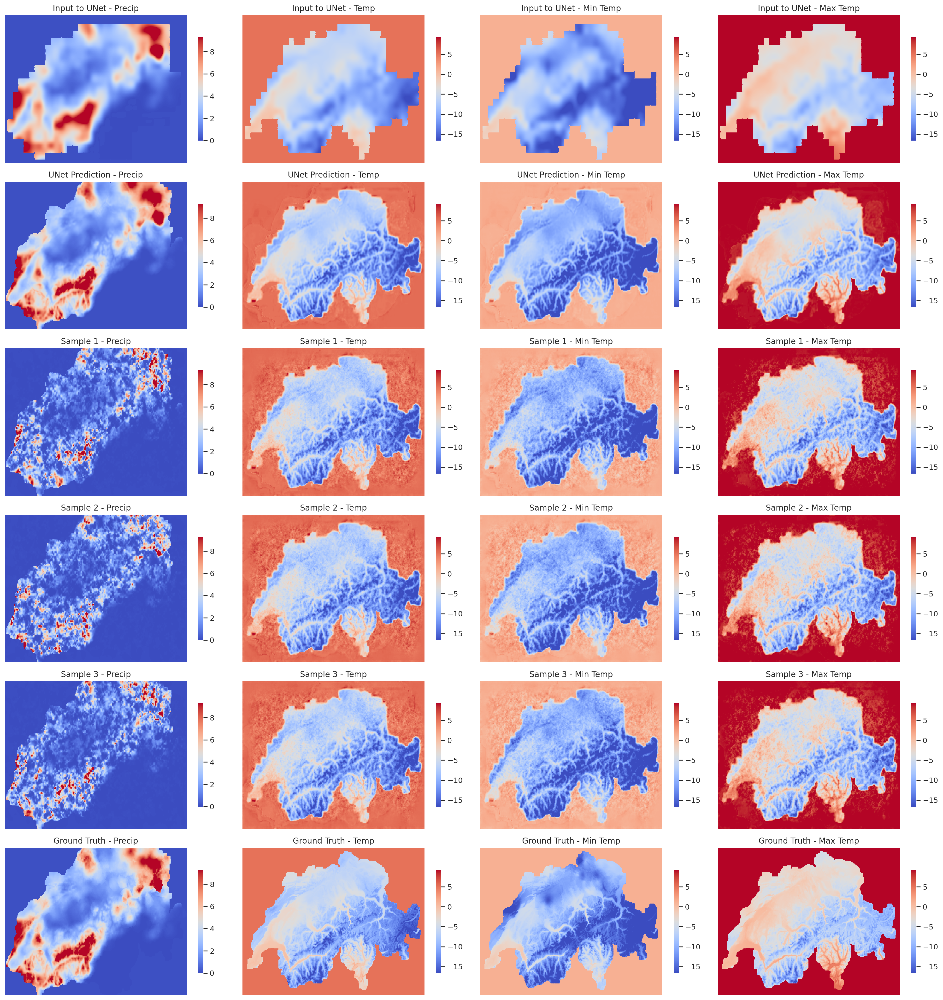

In [38]:
denorm_plot_samples(results_list, input_sample, target_sample)

Calculating  residual plots

In [39]:
def plot_sample_residuals(results_list, input_sample, target_sample):
    input_np = input_sample[0, :4].cpu().numpy()
    target_np = target_sample[0].cpu().numpy()
    input_denorm = np.empty_like(input_np)
    target_denorm = np.empty_like(target_np)
    for i, (var, params) in enumerate([
        ("precip", pr_params),
        ("temp", temp_params),
        ("temp_min", temp_min_params),
        ("temp_max", temp_max_params)
    ]):
        if var == "precip":
            input_denorm[i] = denorm_pr(input_np[i])
            target_denorm[i] = denorm_pr(target_np[i])
        else:
            input_denorm[i] = denorm_temp(input_np[i], params)
            target_denorm[i] = denorm_temp(target_np[i], params)

    # Find minimum shape across all predictions and targets
    shapes = [input_denorm.shape, target_denorm.shape]
    for results in results_list:
        shapes.append(results['final_prediction'][0].cpu().numpy().shape)
    shapes.append(results_list[0]['unet_prediction'][0].cpu().numpy().shape)
    h = min(s[-2] for s in shapes)
    w = min(s[-1] for s in shapes)

    # Crop all arrays to the minimum shape
    input_denorm = input_denorm[..., :h, :w]
    target_denorm = target_denorm[..., :h, :w]

    preds = []
    unet_np = results_list[0]['unet_prediction'][0].cpu().numpy()[..., :h, :w]
    unet_denorm = np.empty_like(unet_np)
    for j in range(4):
        if channel_names[j].lower().startswith("precip"):
            unet_denorm[j] = np.clip(denorm_pr(unet_np[j]), 0, None)
        else:
            params = [pr_params, temp_params, temp_min_params, temp_max_params][j]
            unet_denorm[j] = denorm_temp(unet_np[j], params)
    preds.append(unet_denorm)
    for results in results_list:
        final_np = results['final_prediction'][0].cpu().numpy()[..., :h, :w]
        sample_denorm = np.empty_like(final_np)
        for j in range(4):
            if channel_names[j].lower().startswith("precip"):
                sample_denorm[j] = np.clip(denorm_pr(final_np[j]), 0, None)
            else:
                params = [pr_params, temp_params, temp_min_params, temp_max_params][j]
                sample_denorm[j] = denorm_temp(final_np[j], params)
        preds.append(sample_denorm)

    residuals = [pred - target_denorm for pred in preds]

    n_vars = 4
    n_samples = len(results_list)
    n_rows = n_samples + 1  # UNet + n_samples
    fig, axes = plt.subplots(n_rows, n_vars, figsize=(5 * n_vars, 3.5 * n_rows), dpi=200)
    cmap = sns.color_palette("coolwarm", as_cmap=True)
    cmap.set_bad(color='white')

    all_residuals = np.stack(residuals)


    # Separated scales for precip and temperature residuals
    precip_residuals = all_residuals[..., 0, :, :]
    temp_residuals = all_residuals[..., 1:, :, :].reshape(-1, *all_residuals.shape[2:])

    vmin_precip = np.nanpercentile(precip_residuals, 2)
    vmax_precip = np.nanpercentile(precip_residuals, 98)
    vmin_temp = np.nanpercentile(temp_residuals, 2)
    vmax_temp = np.nanpercentile(temp_residuals, 98)

    for i in range(n_rows):
        for j in range(n_vars):
            arr = residuals[i][j].copy()
            mask = np.any(np.isnan(input_denorm), axis=0)
            arr[mask] = np.nan
            if n_rows == 1:
                ax = axes[j]
            else:
                ax = axes[i, j]
            if j == 0:
                # Precipitation residuals: separate scale
                sns.heatmap(np.flipud(arr), ax=ax, cmap=cmap, vmin=vmin_precip, vmax=vmax_precip, cbar=True, cbar_kws={'shrink': 0.7})
            else:
                # Temperature residuals: common scale
                sns.heatmap(np.flipud(arr), ax=ax, cmap=cmap, vmin=vmin_temp, vmax=vmax_temp, cbar=True, cbar_kws={'shrink': 0.7})
            if i == 0:
                ax.set_title(f"UNet Residual - {channel_names[j]}")
            else:
                ax.set_title(f"Sample {i} Residual - {channel_names[j]}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

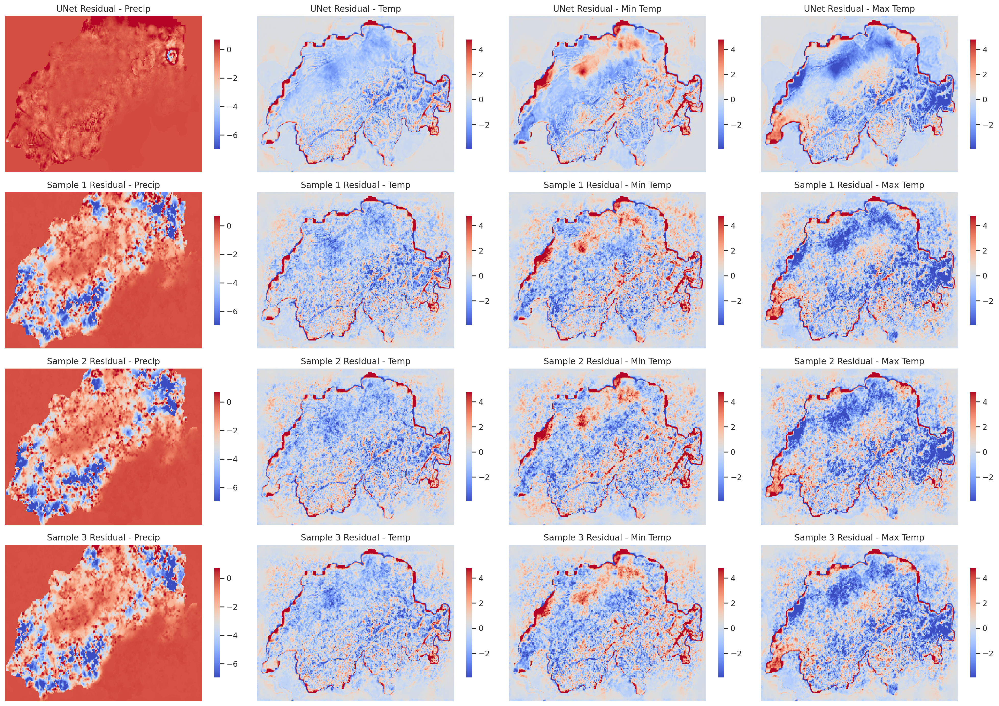

In [40]:
plot_sample_residuals(results_list, input_sample, target_sample)